# SAR2Optical Fine-tuning on QXSLAB_SAROPT Dataset

This notebook fine-tunes the pre-trained SAR2Optical pix2pix model on the QXSLAB_SAROPT dataset.

**Dataset Structure (QXSLAB_SAROPT):**
```
QXSLAB_SAROPT/
├── opt_256_oc_0.2/    (Optical images)
│   ├── 2.png
│   ├── 3.png
│   └── ...
└── sar_256_oc_0.2/    (SAR images)
    ├── 2.png
    ├── 3.png
    └── ...
```

## 1. Setup and GPU Check

In [1]:
# Check GPU availability
!nvidia-smi

Wed Dec 17 11:23:36 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   37C    P0             53W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [2]:
# Install required packages
!pip install -q gdown tqdm pillow

## 2. Download Dataset and Checkpoint from Google Drive

**CHANGE THE FILE IDs BELOW** to match your Google Drive links.

In [3]:
# ============================================================================
# DOWNLOAD DATASET FROM GOOGLE DRIVE
# ============================================================================

# <-- CHANGE THIS: Your Google Drive file ID for QXSLAB_SAROPT.zip
DATASET_FILE_ID = "1835G9HBouBqmk7tKNnIc5gkJ5B8-4v9I"

# Download zip file
!gdown {DATASET_FILE_ID} -O /content/QXSLAB_SAROPT.zip

# Extract
!unzip -q /content/QXSLAB_SAROPT.zip -d /content/

# Check what was extracted
!ls -la /content/

Downloading...
From (original): https://drive.google.com/uc?id=1835G9HBouBqmk7tKNnIc5gkJ5B8-4v9I
From (redirected): https://drive.google.com/uc?id=1835G9HBouBqmk7tKNnIc5gkJ5B8-4v9I&confirm=t&uuid=d27b5e60-20a9-4b3b-9b3f-34173e5b428b
To: /content/QXSLAB_SAROPT.zip
100% 2.93G/2.93G [00:39<00:00, 73.5MB/s]
total 2860440
drwxr-xr-x 1 root root       4096 Dec 17 11:24 .
drwxr-xr-x 1 root root       4096 Dec 17 11:06 ..
drwxr-xr-x 4 root root       4096 Dec  9 14:41 .config
drwxr-xr-x 4 root root       4096 Mar 11  2021 QXSLAB_SAROPT
-rw-r--r-- 1 root root 2929062629 Mar 15  2021 QXSLAB_SAROPT.zip
drwxr-xr-x 1 root root       4096 Dec  9 14:42 sample_data


In [4]:
# ============================================================================
# DOWNLOAD PRETRAINED CHECKPOINT FROM GOOGLE DRIVE
# ============================================================================

# <-- CHANGE THIS: Your Google Drive file ID for pix2pix_gen_180.pth
CHECKPOINT_FILE_ID = "1avb5ua7fYlgQOarS4Xvi3zpsX6s9Z7NV"  # Your checkpoint ID

!gdown {CHECKPOINT_FILE_ID} -O /content/pix2pix_gen_180.pth

# Verify checkpoint size (should be ~200+ MB)
!ls -lh /content/pix2pix_gen_180.pth

Downloading...
From (original): https://drive.google.com/uc?id=1avb5ua7fYlgQOarS4Xvi3zpsX6s9Z7NV
From (redirected): https://drive.google.com/uc?id=1avb5ua7fYlgQOarS4Xvi3zpsX6s9Z7NV&confirm=t&uuid=6ee2d01c-ce67-4a61-a633-00197f324e21
To: /content/pix2pix_gen_180.pth
100% 218M/218M [00:01<00:00, 111MB/s]
-rw-r--r-- 1 root root 209M Dec 16 15:35 /content/pix2pix_gen_180.pth


## 3. Configuration

In [23]:
# ============================================================================
# CONFIGURATION
# ============================================================================

# Paths
DATASET_ROOT = "/content/QXSLAB_SAROPT"          # <-- CHANGE if different
SAR_FOLDER = "sar_256_oc_0.2"                    # <-- CHANGE if different
OPT_FOLDER = "opt_256_oc_0.2"                    # <-- CHANGE if different
PRETRAINED_CHECKPOINT = "/content/pix2pix_gen_180.pth"
OUTPUT_DIR = "/content/finetuned_checkpoints"    # Where to save fine-tuned models

# Training parameters
CONFIG = {
    # Model (keep same as original)
    "c_in": 3,
    "c_out": 3,
    "netD": "patch",
    "lambda_L1": 150.0,
    "is_CGAN": True,
    "use_upsampling": False,
    "mode": "nearest",
    "c_hid": 64,
    "n_layers": 3,

    # Training
    "num_epochs": 10,            # <-- CHANGE: Number of epochs
    "batch_size": 32,             # <-- CHANGE: A100 can handle 32-64
    "lr": 0.000005,                 # Lower LR for fine-tuning
    "beta1": 0.5,
    "beta2": 0.999,
    "save_freq": 5,              # Save every N epochs
    "num_workers": 4,

    # Dataset split
    "split_ratio": [0.8, 0.1, 0.1],  # train/val/test
    "seed": 42,
}

print("Configuration:")
print(f"  Dataset: {DATASET_ROOT}")
print(f"  SAR folder: {SAR_FOLDER}")
print(f"  Optical folder: {OPT_FOLDER}")
print(f"  Pretrained: {PRETRAINED_CHECKPOINT}")
print(f"  Output: {OUTPUT_DIR}")
print(f"  Epochs: {CONFIG['num_epochs']}")
print(f"  Batch size: {CONFIG['batch_size']}")
print(f"  Learning rate: {CONFIG['lr']}")

Configuration:
  Dataset: /content/QXSLAB_SAROPT
  SAR folder: sar_256_oc_0.2
  Optical folder: opt_256_oc_0.2
  Pretrained: /content/pix2pix_gen_180.pth
  Output: /content/finetuned_checkpoints
  Epochs: 10
  Batch size: 32
  Learning rate: 5e-06


## 4. Import Libraries and Define Model

In [6]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2
from PIL import Image
from pathlib import Path
from typing import Tuple, List, Optional, Callable
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import os

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA A100-SXM4-80GB


In [7]:
# ============================================================================
# NETWORK LAYERS
# ============================================================================

class DownsamplingBlock(nn.Module):
    def __init__(self, c_in, c_out, kernel_size=4, stride=2,
                 padding=1, negative_slope=0.2, use_norm=True):
        super(DownsamplingBlock, self).__init__()
        block = [nn.Conv2d(c_in, c_out, kernel_size, stride, padding, bias=(not use_norm))]
        if use_norm:
            block += [nn.BatchNorm2d(c_out)]
        block += [nn.LeakyReLU(negative_slope)]
        self.conv_block = nn.Sequential(*block)

    def forward(self, x):
        return self.conv_block(x)


class UpsamplingBlock(nn.Module):
    def __init__(self, c_in, c_out, kernel_size=4, stride=2,
                 padding=1, use_dropout=False, use_upsampling=False, mode='nearest'):
        super(UpsamplingBlock, self).__init__()
        block = []
        if use_upsampling:
            block += [nn.Sequential(
                nn.Upsample(scale_factor=2, mode=mode),
                nn.Conv2d(c_in, c_out, 3, 1, padding, bias=False))]
        else:
            block += [nn.ConvTranspose2d(c_in, c_out, kernel_size, stride, padding, bias=False)]
        block += [nn.BatchNorm2d(c_out)]
        if use_dropout:
            block += [nn.Dropout(0.5)]
        block += [nn.ReLU()]
        self.conv_block = nn.Sequential(*block)

    def forward(self, x):
        return self.conv_block(x)


class UnetEncoder(nn.Module):
    def __init__(self, c_in=3, c_out=512):
        super(UnetEncoder, self).__init__()
        self.enc1 = DownsamplingBlock(c_in, 64, use_norm=False)
        self.enc2 = DownsamplingBlock(64, 128)
        self.enc3 = DownsamplingBlock(128, 256)
        self.enc4 = DownsamplingBlock(256, 512)
        self.enc5 = DownsamplingBlock(512, 512)
        self.enc6 = DownsamplingBlock(512, 512)
        self.enc7 = DownsamplingBlock(512, 512)
        self.enc8 = DownsamplingBlock(512, c_out)

    def forward(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(x1)
        x3 = self.enc3(x2)
        x4 = self.enc4(x3)
        x5 = self.enc5(x4)
        x6 = self.enc6(x5)
        x7 = self.enc7(x6)
        x8 = self.enc8(x7)
        return [x8, x7, x6, x5, x4, x3, x2, x1]


class UnetDecoder(nn.Module):
    def __init__(self, c_in=512, c_out=64, use_upsampling=False, mode='nearest'):
        super(UnetDecoder, self).__init__()
        self.dec1 = UpsamplingBlock(c_in, 512, use_dropout=True, use_upsampling=use_upsampling, mode=mode)
        self.dec2 = UpsamplingBlock(1024, 512, use_dropout=True, use_upsampling=use_upsampling, mode=mode)
        self.dec3 = UpsamplingBlock(1024, 512, use_dropout=True, use_upsampling=use_upsampling, mode=mode)
        self.dec4 = UpsamplingBlock(1024, 512, use_upsampling=use_upsampling, mode=mode)
        self.dec5 = UpsamplingBlock(1024, 256, use_upsampling=use_upsampling, mode=mode)
        self.dec6 = UpsamplingBlock(512, 128, use_upsampling=use_upsampling, mode=mode)
        self.dec7 = UpsamplingBlock(256, 64, use_upsampling=use_upsampling, mode=mode)
        self.dec8 = UpsamplingBlock(128, c_out, use_upsampling=use_upsampling, mode=mode)

    def forward(self, x):
        x9 = torch.cat([x[1], self.dec1(x[0])], 1)
        x10 = torch.cat([x[2], self.dec2(x9)], 1)
        x11 = torch.cat([x[3], self.dec3(x10)], 1)
        x12 = torch.cat([x[4], self.dec4(x11)], 1)
        x13 = torch.cat([x[5], self.dec5(x12)], 1)
        x14 = torch.cat([x[6], self.dec6(x13)], 1)
        x15 = torch.cat([x[7], self.dec7(x14)], 1)
        return self.dec8(x15)


class UnetGenerator(nn.Module):
    def __init__(self, c_in=3, c_out=3, use_upsampling=False, mode='nearest'):
        super(UnetGenerator, self).__init__()
        self.encoder = UnetEncoder(c_in=c_in)
        self.decoder = UnetDecoder(use_upsampling=use_upsampling, mode=mode)
        self.head = nn.Sequential(
            nn.Conv2d(64, c_out, 3, 1, 1, bias=True),
            nn.Tanh())

    def forward(self, x):
        return self.head(self.decoder(self.encoder(x)))


class PatchDiscriminator(nn.Module):
    def __init__(self, c_in=3, c_hid=64, n_layers=3):
        super(PatchDiscriminator, self).__init__()
        model = [DownsamplingBlock(c_in, c_hid, use_norm=False)]
        n_p, n_c = 1, 1
        for n in range(1, n_layers):
            n_p, n_c = n_c, min(2**n, 8)
            model += [DownsamplingBlock(c_hid*n_p, c_hid*n_c)]
        n_p, n_c = n_c, min(2**n_layers, 8)
        model += [DownsamplingBlock(c_hid*n_p, c_hid*n_c, stride=1)]
        model += [nn.Conv2d(c_hid*n_c, 1, 4, 1, 1, bias=True)]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


class PatchGAN(nn.Module):
    def __init__(self, c_in=3, c_hid=64, mode='patch', n_layers=3):
        super(PatchGAN, self).__init__()
        self.model = PatchDiscriminator(c_in, c_hid, n_layers)

    def forward(self, x):
        return self.model(x)

print("Network layers defined!")

Network layers defined!


In [8]:
# ============================================================================
# PIX2PIX MODEL
# ============================================================================

class Pix2Pix(nn.Module):
    def __init__(self, c_in=3, c_out=3, is_train=True, netD='patch',
                 lambda_L1=100.0, is_CGAN=True, use_upsampling=False,
                 mode='nearest', c_hid=64, n_layers=3, lr=0.0002,
                 beta1=0.5, beta2=0.999):
        super(Pix2Pix, self).__init__()
        self.is_CGAN = is_CGAN
        self.lambda_L1 = lambda_L1
        self.is_train = is_train

        self.gen = UnetGenerator(c_in, c_out, use_upsampling, mode)
        self.gen.apply(self._weights_init)

        if is_train:
            disc_in = c_in + c_out if is_CGAN else c_out
            self.disc = PatchGAN(disc_in, c_hid, netD, n_layers)
            self.disc.apply(self._weights_init)
            self.gen_optimizer = torch.optim.Adam(self.gen.parameters(), lr=lr, betas=(beta1, beta2))
            self.disc_optimizer = torch.optim.Adam(self.disc.parameters(), lr=lr, betas=(beta1, beta2))
            self.criterion = nn.BCEWithLogitsLoss()
            self.criterion_L1 = nn.L1Loss()

    @staticmethod
    def _weights_init(m):
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
            nn.init.normal_(m.weight, 0.0, 0.02)
            if m.bias is not None:
                nn.init.constant_(m.bias, 0.0)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.normal_(m.weight, 1.0, 0.02)
            nn.init.constant_(m.bias, 0)

    def forward(self, x):
        return self.gen(x)

    def train_step(self, real_images, target_images):
        fake_images = self.gen(real_images)

        # Discriminator step
        self.disc_optimizer.zero_grad()
        if self.is_CGAN:
            real_AB = torch.cat([real_images, target_images], 1)
            fake_AB = torch.cat([real_images, fake_images.detach()], 1)
        else:
            real_AB, fake_AB = target_images, fake_images.detach()

        pred_real = self.disc(real_AB)
        pred_fake = self.disc(fake_AB)
        lossD = 0.5 * (self.criterion(pred_real, torch.ones_like(pred_real)) +
                       self.criterion(pred_fake, torch.zeros_like(pred_fake)))
        lossD.backward()
        self.disc_optimizer.step()

        # Generator step
        self.gen_optimizer.zero_grad()
        if self.is_CGAN:
            fake_AB = torch.cat([real_images, fake_images], 1)
        else:
            fake_AB = fake_images
        pred_fake = self.disc(fake_AB)
        lossG_GAN = self.criterion(pred_fake, torch.ones_like(pred_fake))
        lossG_L1 = self.criterion_L1(fake_images, target_images)
        lossG = lossG_GAN + self.lambda_L1 * lossG_L1
        lossG.backward()
        self.gen_optimizer.step()

        return {
            'loss_D': lossD.item(),
            'loss_G': lossG.item(),
            'loss_G_GAN': lossG_GAN.item(),
            'loss_G_L1': lossG_L1.item()
        }

    def validation_step(self, real_images, target_images):
        with torch.no_grad():
            fake_images = self.gen(real_images)
            if self.is_CGAN:
                real_AB = torch.cat([real_images, target_images], 1)
                fake_AB = torch.cat([real_images, fake_images], 1)
            else:
                real_AB, fake_AB = target_images, fake_images

            pred_real = self.disc(real_AB)
            pred_fake = self.disc(fake_AB)
            lossD = 0.5 * (self.criterion(pred_real, torch.ones_like(pred_real)) +
                           self.criterion(pred_fake, torch.zeros_like(pred_fake)))
            lossG_GAN = self.criterion(pred_fake, torch.ones_like(pred_fake))
            lossG_L1 = self.criterion_L1(fake_images, target_images)
            lossG = lossG_GAN + self.lambda_L1 * lossG_L1

        return {
            'loss_D': lossD.item(),
            'loss_G': lossG.item(),
            'loss_G_GAN': lossG_GAN.item(),
            'loss_G_L1': lossG_L1.item()
        }

    def save_model(self, gen_path, disc_path=None):
        torch.save(self.gen.state_dict(), gen_path)
        if self.is_train and disc_path:
            torch.save(self.disc.state_dict(), disc_path)

    def load_generator(self, gen_path, device):
        self.gen.load_state_dict(torch.load(gen_path, map_location=device, weights_only=False), strict=False)

print("Pix2Pix model defined!")

Pix2Pix model defined!


In [9]:
# ============================================================================
# QXSLAB_SAROPT DATASET CLASS (WITH PAIR VALIDATION + DATA AUGMENTATION)
# ============================================================================

from torch.utils.data import Dataset
from pathlib import Path
from PIL import Image
import torch
from torchvision.transforms import v2
import torchvision.transforms.functional as TF
from typing import Tuple, List, Callable
import random

class QXSLABDataset(Dataset):
    """
    Dataset for QXSLAB_SAROPT with data augmentation.

    Structure:
        root/
        ├── sar_256_oc_0.2/  (SAR images)
        └── opt_256_oc_0.2/  (Optical images)

    Only loads pairs where BOTH SAR and Optical images exist.
    Augmentation is applied identically to both SAR and Optical images.
    """
    def __init__(self,
                 root_dir: str,
                 sar_folder: str = "sar_256_oc_0.2",
                 opt_folder: str = "opt_256_oc_0.2",
                 split: str = None,
                 split_ratio: Tuple[float, float, float] = (0.8, 0.1, 0.1),
                 augment: bool = False,  # Enable augmentation for training
                 seed: int = 42):

        self.root_dir = Path(root_dir)
        self.sar_dir = self.root_dir / sar_folder
        self.opt_dir = self.root_dir / opt_folder
        self.augment = augment

        # Verify directories exist
        if not self.sar_dir.exists():
            raise FileNotFoundError(f"SAR directory not found: {self.sar_dir}")
        if not self.opt_dir.exists():
            raise FileNotFoundError(f"Optical directory not found: {self.opt_dir}")

        # Base transform (always applied)
        self.base_transform = v2.Compose([
            v2.ToImage(),
            v2.Resize((256, 256)),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(mean=[0.5], std=[0.5]),
        ])

        # Find valid pairs (both SAR and Optical exist)
        self.image_pairs, self.missing = self._find_valid_pairs()

        # Apply split
        if split:
            self.image_pairs = self._apply_split(split, split_ratio, seed)
            print(f"[{split}] Using {len(self.image_pairs)} pairs (augment={augment})")

    def _find_valid_pairs(self) -> Tuple[List[Tuple[Path, Path]], List[str]]:
        """Find pairs where BOTH SAR and Optical images exist."""
        valid_pairs = []
        missing = []

        # Get all files in each folder
        sar_files = {f.stem: f for f in self.sar_dir.glob("*.png")}
        opt_files = {f.stem: f for f in self.opt_dir.glob("*.png")}

        # Also check jpg
        sar_files.update({f.stem: f for f in self.sar_dir.glob("*.jpg")})
        opt_files.update({f.stem: f for f in self.opt_dir.glob("*.jpg")})

        print(f"SAR images found: {len(sar_files)}")
        print(f"Optical images found: {len(opt_files)}")

        # Check each SAR image for matching Optical
        for name, sar_path in sar_files.items():
            if name in opt_files:
                valid_pairs.append((sar_path, opt_files[name]))
            else:
                missing.append(name)

        # Sort pairs by filename (numeric)
        try:
            valid_pairs.sort(key=lambda x: int(x[0].stem))
        except ValueError:
            valid_pairs.sort(key=lambda x: x[0].stem)

        print(f"\nValid pairs (both exist): {len(valid_pairs)}")
        print(f"Missing optical images: {len(missing)}")

        if missing and len(missing) <= 20:
            print(f"Missing files: {missing}")
        elif missing:
            print(f"First 10 missing: {missing[:10]}...")

        return valid_pairs, missing

    def _apply_split(self, split, split_ratio, seed):
        """Apply train/val/test split."""
        random.seed(seed)
        indices = list(range(len(self.image_pairs)))
        random.shuffle(indices)

        n = len(indices)
        train_end = int(n * split_ratio[0])
        val_end = train_end + int(n * split_ratio[1])

        if split == 'train':
            indices = indices[:train_end]
        elif split == 'val':
            indices = indices[train_end:val_end]
        elif split == 'test':
            indices = indices[val_end:]

        return [self.image_pairs[i] for i in indices]

    def _apply_augmentation(self, sar_img: Image.Image, opt_img: Image.Image) -> Tuple[Image.Image, Image.Image]:
        """
        Apply the SAME random augmentation to both images.
        This keeps SAR and Optical aligned.
        """
        # Random horizontal flip (50% chance)
        if random.random() > 0.5:
            sar_img = TF.hflip(sar_img)
            opt_img = TF.hflip(opt_img)

        # Random vertical flip (50% chance)
        if random.random() > 0.5:
            sar_img = TF.vflip(sar_img)
            opt_img = TF.vflip(opt_img)

        # Random 90-degree rotation (0, 90, 180, or 270 degrees)
        angle = random.choice([0, 90, 180, 270])
        if angle != 0:
            sar_img = TF.rotate(sar_img, angle)
            opt_img = TF.rotate(opt_img, angle)

        return sar_img, opt_img

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx) -> Tuple[torch.Tensor, torch.Tensor]:
        sar_path, opt_path = self.image_pairs[idx]

        # Load images
        sar_img = Image.open(sar_path).convert('RGB')
        opt_img = Image.open(opt_path).convert('RGB')

        # Apply augmentation (same transforms to both)
        if self.augment:
            sar_img, opt_img = self._apply_augmentation(sar_img, opt_img)

        # Apply base transforms
        sar_tensor = self.base_transform(sar_img)
        opt_tensor = self.base_transform(opt_img)

        return sar_tensor, opt_tensor


print("QXSLABDataset class defined (with augmentation support)!")


QXSLABDataset class defined (with augmentation support)!


## 5. Create Datasets and DataLoaders

In [10]:
# Create datasets
print("Creating datasets...\n")

train_dataset = QXSLABDataset(
    root_dir=DATASET_ROOT,
    sar_folder=SAR_FOLDER,
    opt_folder=OPT_FOLDER,
    split='train',
    split_ratio=CONFIG['split_ratio'],
    augment=True,
    seed=CONFIG['seed']
)

val_dataset = QXSLABDataset(
    root_dir=DATASET_ROOT,
    sar_folder=SAR_FOLDER,
    opt_folder=OPT_FOLDER,
    split='val',
    split_ratio=CONFIG['split_ratio'],
    augment=False,
    seed=CONFIG['seed']
)

# Create dataloaders
train_loader = DataLoader(
    train_dataset,
    batch_size=CONFIG['batch_size'],
    shuffle=True,
    num_workers=CONFIG['num_workers'],
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=CONFIG['batch_size'],
    shuffle=False,
    num_workers=CONFIG['num_workers'],
    pin_memory=True
)

print(f"\nTrain batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")

Creating datasets...

SAR images found: 20000
Optical images found: 20000

Valid pairs (both exist): 20000
Missing optical images: 0
[train] Using 16000 pairs (augment=True)
SAR images found: 20000
Optical images found: 20000

Valid pairs (both exist): 20000
Missing optical images: 0
[val] Using 2000 pairs (augment=False)

Train batches: 500
Val batches: 63


In [11]:
# ============================================================================
# VERIFY DATASET STRUCTURE AND PAIRS
# ============================================================================

# <-- CHANGE THESE if your folders have different names
DATASET_ROOT = "/content/QXSLAB_SAROPT"  # <-- CHANGE if extracted differently
SAR_FOLDER = "sar_256_oc_0.2"            # <-- CHANGE if different
OPT_FOLDER = "opt_256_oc_0.2"            # <-- CHANGE if different

print("=" * 60)
print("VERIFYING DATASET")
print("=" * 60)

# Check folder exists
import os
from pathlib import Path

root = Path(DATASET_ROOT)
if not root.exists():
    # Maybe it's nested, check /content/
    print(f"Looking for dataset in /content/...")
    !ls -la /content/
else:
    print(f"Dataset root: {DATASET_ROOT}")
    !ls -la {DATASET_ROOT}

# Test dataset loading
print("\n" + "=" * 60)
print("TESTING DATASET LOADING")
print("=" * 60)

try:
    test_dataset = QXSLABDataset(
        root_dir=DATASET_ROOT,
        sar_folder=SAR_FOLDER,
        opt_folder=OPT_FOLDER,
        split=None  # Load all to see total count
    )
    print(f"\n✅ Dataset loaded successfully!")
    print(f"✅ Total valid pairs: {len(test_dataset)}")

    # Show a sample
    if len(test_dataset) > 0:
        sar, opt = test_dataset[0]
        print(f"✅ Sample SAR shape: {sar.shape}")
        print(f"✅ Sample Optical shape: {opt.shape}")

except Exception as e:
    print(f"❌ Error: {e}")


VERIFYING DATASET
Dataset root: /content/QXSLAB_SAROPT
total 1032
drwxr-xr-x 4 root root   4096 Mar 11  2021 .
drwxr-xr-x 1 root root   4096 Dec 17 11:24 ..
drwxr-xr-x 2 root root 520192 Mar 11  2021 opt_256_oc_0.2
drwxr-xr-x 2 root root 520192 Mar 11  2021 sar_256_oc_0.2

TESTING DATASET LOADING
SAR images found: 20000
Optical images found: 20000

Valid pairs (both exist): 20000
Missing optical images: 0

✅ Dataset loaded successfully!
✅ Total valid pairs: 20000
✅ Sample SAR shape: torch.Size([3, 256, 256])
✅ Sample Optical shape: torch.Size([3, 256, 256])


Sample SAR-Optical pairs:


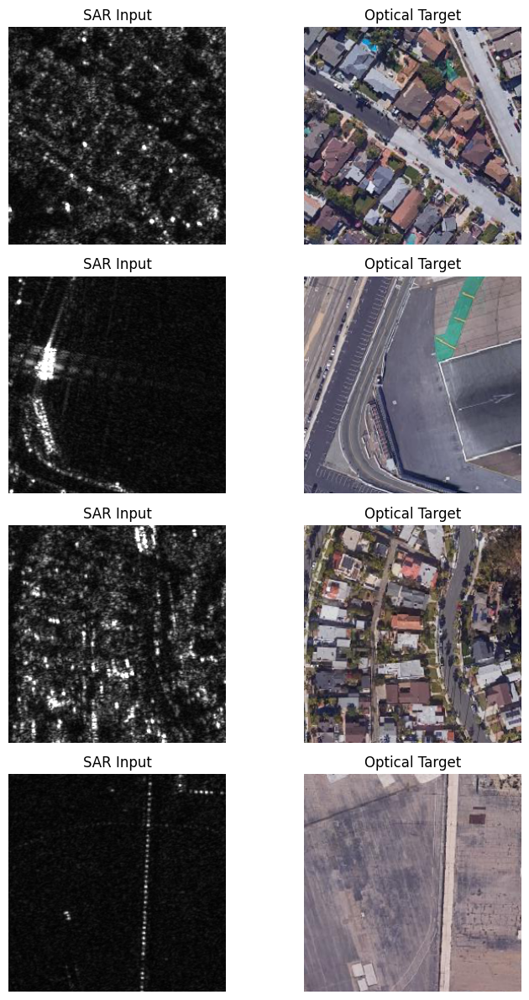

In [12]:
# Visualize sample pairs
def show_samples(dataset, num=4):
    fig, axes = plt.subplots(num, 2, figsize=(8, 3*num))
    for i in range(num):
        idx = random.randint(0, len(dataset)-1)
        sar, opt = dataset[idx]

        # Denormalize
        sar = (sar * 0.5 + 0.5).permute(1,2,0).numpy()
        opt = (opt * 0.5 + 0.5).permute(1,2,0).numpy()

        axes[i,0].imshow(sar)
        axes[i,0].set_title('SAR Input')
        axes[i,0].axis('off')
        axes[i,1].imshow(opt)
        axes[i,1].set_title('Optical Target')
        axes[i,1].axis('off')
    plt.tight_layout()
    plt.show()

print("Sample SAR-Optical pairs:")
show_samples(train_dataset)

## 6. Initialize Model and Load Pretrained Weights

In [13]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Create model
model = Pix2Pix(
    c_in=CONFIG['c_in'],
    c_out=CONFIG['c_out'],
    is_train=True,
    netD=CONFIG['netD'],
    lambda_L1=CONFIG['lambda_L1'],
    is_CGAN=CONFIG['is_CGAN'],
    use_upsampling=CONFIG['use_upsampling'],
    mode=CONFIG['mode'],
    c_hid=CONFIG['c_hid'],
    n_layers=CONFIG['n_layers'],
    lr=CONFIG['lr'],
    beta1=CONFIG['beta1'],
    beta2=CONFIG['beta2']
).to(device)

print("Model created!")

Using device: cuda
Model created!


In [14]:
# ============================================================================
# LOAD PRETRAINED GENERATOR WEIGHTS
# ============================================================================

print(f"Loading pretrained weights from: {PRETRAINED_CHECKPOINT}")

if os.path.exists(PRETRAINED_CHECKPOINT):
    file_size_mb = os.path.getsize(PRETRAINED_CHECKPOINT) / (1024*1024)
    print(f"Checkpoint size: {file_size_mb:.2f} MB")

    if file_size_mb < 1:
        print("WARNING: File too small - may be corrupted!")
        print("Will train from scratch.")
    else:
        # Load with weights_only=False for PyTorch 2.6+ compatibility
        model.load_generator(PRETRAINED_CHECKPOINT, device)
        print("Pretrained generator loaded successfully!")
else:
    print(f"WARNING: Checkpoint not found!")
    print("Training from scratch...")

# Count parameters
gen_params = sum(p.numel() for p in model.gen.parameters())
disc_params = sum(p.numel() for p in model.disc.parameters())
print(f"\nGenerator params: {gen_params:,}")
print(f"Discriminator params: {disc_params:,}")

Loading pretrained weights from: /content/pix2pix_gen_180.pth
Checkpoint size: 208.14 MB
Pretrained generator loaded successfully!

Generator params: 54,541,827
Discriminator params: 2,768,705


## 7. Training Loop

In [15]:
def train_epoch(model, loader, device, epoch):
    model.train()
    total_D, total_G, total_GAN, total_L1 = 0, 0, 0, 0

    pbar = tqdm(loader, desc=f"Epoch {epoch}")
    for sar, opt in pbar:
        sar, opt = sar.to(device), opt.to(device)
        losses = model.train_step(sar, opt)

        total_D += losses['loss_D']
        total_G += losses['loss_G']
        total_GAN += losses['loss_G_GAN']
        total_L1 += losses['loss_G_L1']

        pbar.set_postfix({'D': f"{losses['loss_D']:.3f}", 'G': f"{losses['loss_G']:.3f}"})

    n = len(loader)
    return {'D': total_D/n, 'G': total_G/n, 'GAN': total_GAN/n, 'L1': total_L1/n}


def validate(model, loader, device):
    model.eval()
    total_D, total_G, total_GAN, total_L1 = 0, 0, 0, 0

    for sar, opt in loader:
        sar, opt = sar.to(device), opt.to(device)
        losses = model.validation_step(sar, opt)
        total_D += losses['loss_D']
        total_G += losses['loss_G']
        total_GAN += losses['loss_G_GAN']
        total_L1 += losses['loss_G_L1']

    n = len(loader)
    return {'D': total_D/n, 'G': total_G/n, 'GAN': total_GAN/n, 'L1': total_L1/n}


def visualize_predictions(model, loader, device, num=4):
    model.eval()
    sar, opt = next(iter(loader))
    sar, opt = sar[:num].to(device), opt[:num].to(device)

    with torch.no_grad():
        fake = model.gen(sar)

    # Denormalize
    sar = (sar * 0.5 + 0.5).cpu()
    opt = (opt * 0.5 + 0.5).cpu()
    fake = (fake * 0.5 + 0.5).cpu()

    fig, axes = plt.subplots(num, 3, figsize=(12, 3*num))
    for i in range(num):
        axes[i,0].imshow(sar[i].permute(1,2,0))
        axes[i,0].set_title('SAR Input')
        axes[i,0].axis('off')
        axes[i,1].imshow(fake[i].permute(1,2,0))
        axes[i,1].set_title('Generated')
        axes[i,1].axis('off')
        axes[i,2].imshow(opt[i].permute(1,2,0))
        axes[i,2].set_title('Ground Truth')
        axes[i,2].axis('off')
    plt.tight_layout()
    plt.show()

print("Training functions ready!")

Training functions ready!


In [19]:
# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Training history
history = {'train_D':[], 'train_G':[], 'train_L1':[], 'val_D':[], 'val_G':[], 'val_L1':[]}
best_val_loss = float('inf')

print("="*60)
print("STARTING FINE-TUNING ON QXSLAB_SAROPT")
print("="*60)
print(f"Epochs: {CONFIG['num_epochs']}")
print(f"Batch size: {CONFIG['batch_size']}")
print(f"Learning rate: {CONFIG['lr']}")
print(f"Output: {OUTPUT_DIR}")
print("="*60)

STARTING FINE-TUNING ON QXSLAB_SAROPT
Epochs: 40
Batch size: 32
Learning rate: 1e-05
Output: /content/finetuned_checkpoints


Epoch 1: 100%|██████████| 500/500 [00:44<00:00, 11.12it/s, D=0.462, G=30.870]


Epoch 1: Train[D:0.4228 G:29.8259 L1:0.2845] Val[D:0.5813 G:32.4108 L1:0.3145]

Visualization at epoch 1:


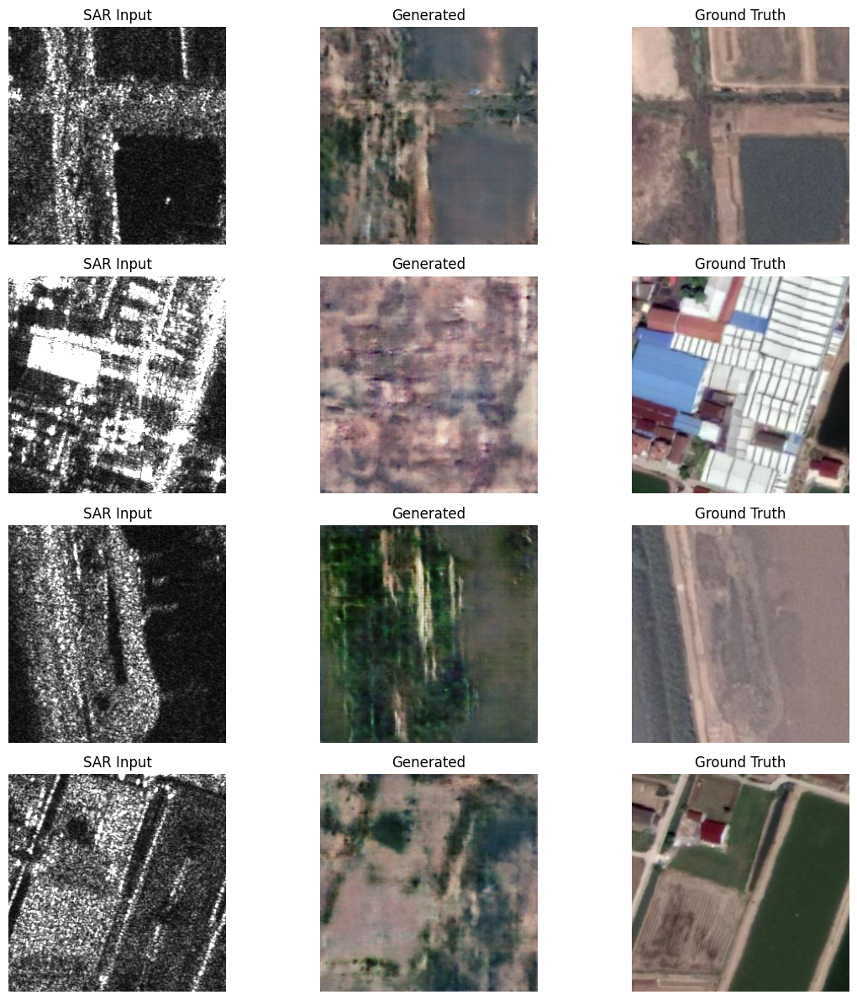

Epoch 2: 100%|██████████| 500/500 [00:45<00:00, 11.07it/s, D=0.342, G=31.816]


Epoch 2: Train[D:0.4183 G:29.8182 L1:0.2844] Val[D:0.5976 G:32.5713 L1:0.3146]


Epoch 3: 100%|██████████| 500/500 [00:45<00:00, 11.07it/s, D=0.315, G=30.217]


Epoch 3: Train[D:0.4222 G:29.7931 L1:0.2843] Val[D:0.5923 G:31.9919 L1:0.3092]


Epoch 4: 100%|██████████| 500/500 [00:45<00:00, 11.06it/s, D=0.891, G=25.499]


Epoch 4: Train[D:0.4238 G:29.8202 L1:0.2846] Val[D:0.6375 G:32.1486 L1:0.3116]


Epoch 5: 100%|██████████| 500/500 [00:45<00:00, 11.05it/s, D=0.409, G=27.734]


Epoch 5: Train[D:0.4142 G:29.7480 L1:0.2835] Val[D:0.5918 G:32.7749 L1:0.3178]
  -> Checkpoint saved at epoch 5

Visualization at epoch 5:


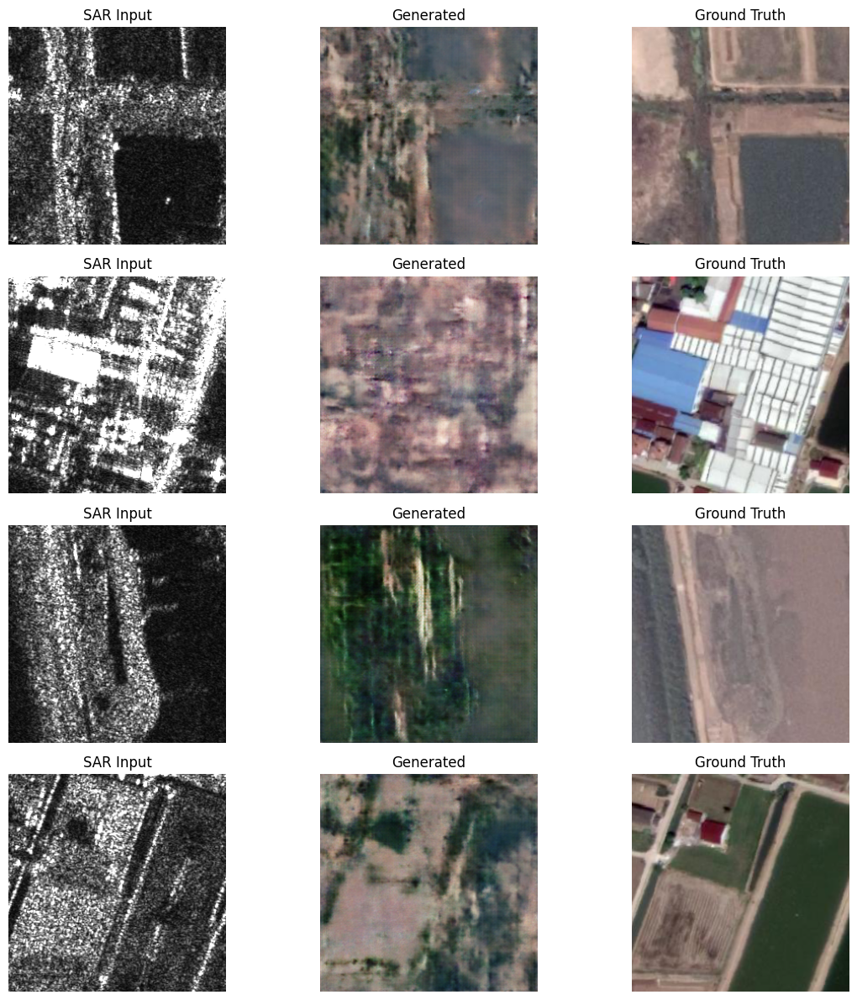

Epoch 6: 100%|██████████| 500/500 [00:45<00:00, 11.05it/s, D=0.338, G=29.767]


Epoch 6: Train[D:0.4188 G:29.6942 L1:0.2831] Val[D:0.5944 G:32.2306 L1:0.3117]


Epoch 7: 100%|██████████| 500/500 [00:45<00:00, 11.07it/s, D=0.364, G=29.182]


Epoch 7: Train[D:0.4187 G:29.7314 L1:0.2835] Val[D:0.5881 G:32.0130 L1:0.3100]


Epoch 8: 100%|██████████| 500/500 [00:45<00:00, 11.07it/s, D=0.463, G=27.918]


Epoch 8: Train[D:0.4206 G:29.6928 L1:0.2832] Val[D:0.5804 G:32.1913 L1:0.3113]


Epoch 9: 100%|██████████| 500/500 [00:45<00:00, 11.07it/s, D=0.482, G=28.044]


Epoch 9: Train[D:0.4179 G:29.6522 L1:0.2827] Val[D:0.6129 G:32.4787 L1:0.3141]


Epoch 10: 100%|██████████| 500/500 [00:45<00:00, 11.08it/s, D=0.274, G=27.798]


Epoch 10: Train[D:0.4197 G:29.6280 L1:0.2825] Val[D:0.5994 G:32.2977 L1:0.3134]
  -> Checkpoint saved at epoch 10

Visualization at epoch 10:


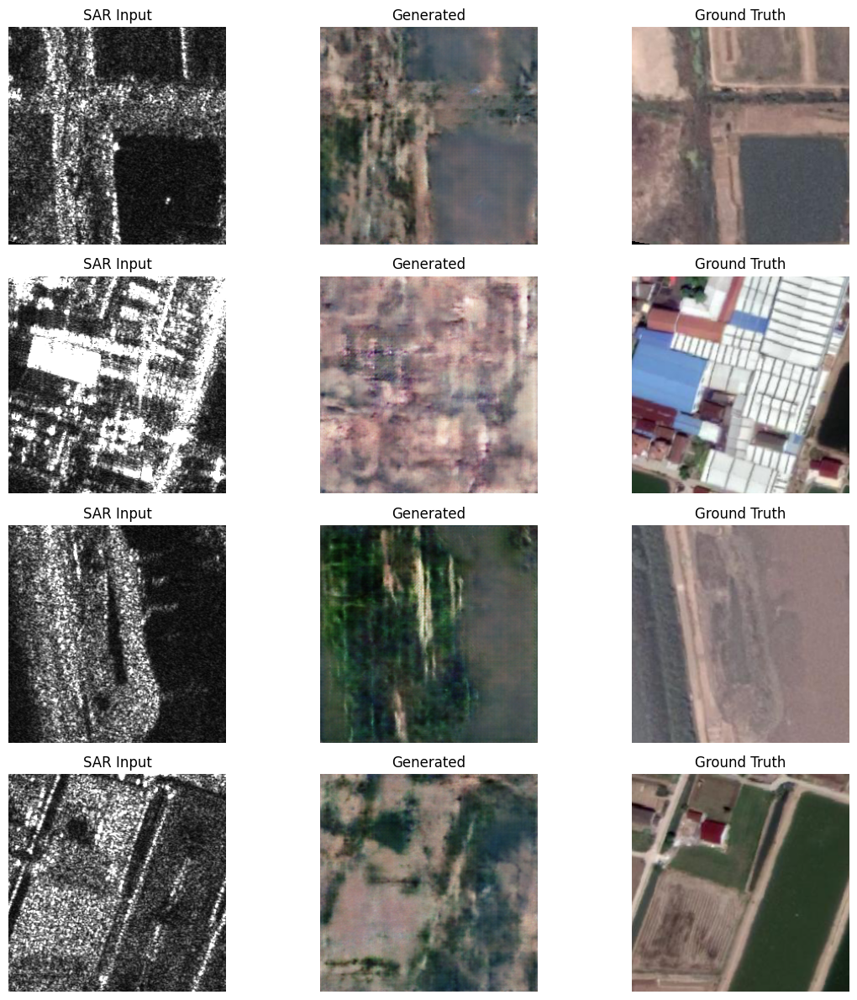


TRAINING COMPLETE!


In [24]:
# ============================================================================
# MAIN TRAINING LOOP
# ============================================================================

for epoch in range(1, CONFIG['num_epochs'] + 1):
    # Train
    train_loss = train_epoch(model, train_loader, device, epoch)

    # Validate
    val_loss = validate(model, val_loader, device)

    # Store history
    history['train_D'].append(train_loss['D'])
    history['train_G'].append(train_loss['G'])
    history['train_L1'].append(train_loss['L1'])
    history['val_D'].append(val_loss['D'])
    history['val_G'].append(val_loss['G'])
    history['val_L1'].append(val_loss['L1'])

    # Print summary
    print(f"Epoch {epoch}: Train[D:{train_loss['D']:.4f} G:{train_loss['G']:.4f} L1:{train_loss['L1']:.4f}] "
          f"Val[D:{val_loss['D']:.4f} G:{val_loss['G']:.4f} L1:{val_loss['L1']:.4f}]")

    # Save best model
    if val_loss['G'] < best_val_loss:
        best_val_loss = val_loss['G']
        model.save_model(
            f"{OUTPUT_DIR}/pix2pix_gen_qxslab_best.pth",
            f"{OUTPUT_DIR}/pix2pix_disc_qxslab_best.pth"
        )
        print(f"  -> New best model saved! (val_G: {best_val_loss:.4f})")

    # Periodic checkpoint
    if epoch % CONFIG['save_freq'] == 0:
        model.save_model(
            f"{OUTPUT_DIR}/pix2pix_gen_qxslab_epoch{epoch}.pth",
            f"{OUTPUT_DIR}/pix2pix_disc_qxslab_epoch{epoch}.pth"
        )
        print(f"  -> Checkpoint saved at epoch {epoch}")

    # Visualize every 5 epochs
    if epoch % 5 == 0 or epoch == 1:
        print(f"\nVisualization at epoch {epoch}:")
        visualize_predictions(model, val_loader, device)

# Save final model
model.save_model(
    f"{OUTPUT_DIR}/pix2pix_gen_qxslab_final.pth",
    f"{OUTPUT_DIR}/pix2pix_disc_qxslab_final.pth"
)

print("\n" + "="*60)
print("TRAINING COMPLETE!")
print("="*60)

## 8. Plot Training History

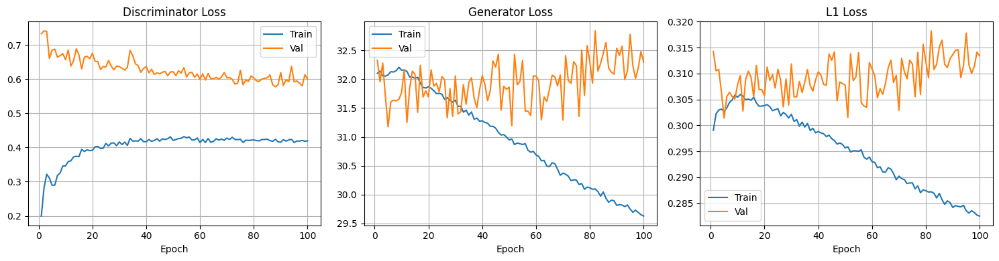

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
epochs = range(1, len(history['train_D'])+1)

axes[0].plot(epochs, history['train_D'], label='Train')
axes[0].plot(epochs, history['val_D'], label='Val')
axes[0].set_title('Discriminator Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(True)

axes[1].plot(epochs, history['train_G'], label='Train')
axes[1].plot(epochs, history['val_G'], label='Val')
axes[1].set_title('Generator Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(True)

axes[2].plot(epochs, history['train_L1'], label='Train')
axes[2].plot(epochs, history['val_L1'], label='Val')
axes[2].set_title('L1 Loss')
axes[2].set_xlabel('Epoch')
axes[2].legend()
axes[2].grid(True)

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/training_history.png", dpi=150)
plt.show()

## 9. Final Evaluation

Best model loaded!

Final Results:


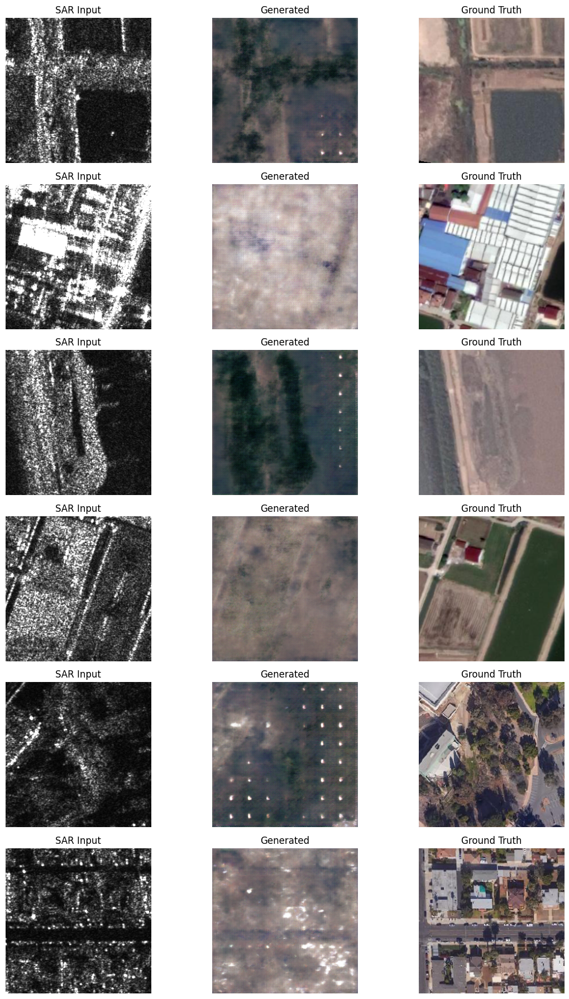

In [26]:
# Load best model
best_path = f"{OUTPUT_DIR}/pix2pix_gen_qxslab_best.pth"
if os.path.exists(best_path):
    model.load_generator(best_path, device)
    print("Best model loaded!")

print("\nFinal Results:")
visualize_predictions(model, val_loader, device, num=6)

In [ ]:
# List saved models
print("Saved checkpoints:")
!ls -lh {OUTPUT_DIR}/

In [ ]:
print(OUTPUT_DIR)

## 10. Download Models (Optional)

In [ ]:
# Search for ANY .pth files anywhere in /content
!find /content -name "*.pth" 2>/dev/null

# Also check what directories exist
!ls -la /content/


In [ ]:
# Try litterbox (temporary file hosting)
!curl -F "reqtype=fileupload" -F "time=72h" -F "fileToUpload=@/content/finetuned_checkpoints/pix2pix_gen_qxslab_best.pth" https://litterbox.catbox.moe/resources/internals/api.php

---

## Summary: Paths to Change

| Variable | Description | Example |
|----------|-------------|--------|
| `DATASET_FILE_ID` | Google Drive ID for QXSLAB_SAROPT.zip | `"1abc...xyz"` |
| `CHECKPOINT_FILE_ID` | Google Drive ID for pix2pix_gen_180.pth | `"1avb5ua7fYlgQOarS4Xvi3zpsX6s9Z7NV"` |
| `DATASET_ROOT` | Path after unzipping | `"/content/QXSLAB_SAROPT"` |
| `SAR_FOLDER` | SAR images folder name | `"sar_256_oc_0.2"` |
| `OPT_FOLDER` | Optical images folder name | `"opt_256_oc_0.2"` |
| `OUTPUT_DIR` | Where to save checkpoints | `"/content/finetuned_checkpoints"` |

# New

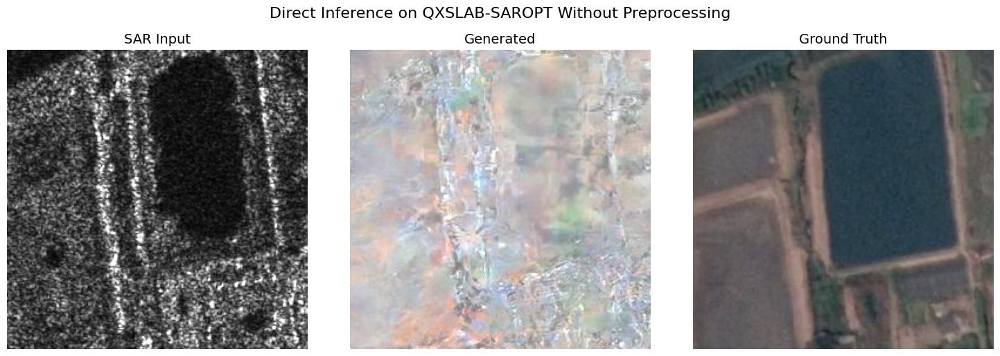

In [6]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def plot_sar_prediction_groundtruth(sar_path, predicted_path, groundtruth_path, 
                                      save_path=None, title=None):
    """
    Plot SAR input, predicted optical, and ground truth optical in a 1x3 grid.
    
    Args:
        sar_path: Path to SAR input image
        predicted_path: Path to model prediction image
        groundtruth_path: Path to ground truth optical image
        save_path: Optional path to save the figure
        title: Optional overall title for the figure
    """
    # Load images
    sar = Image.open(sar_path)
    predicted = Image.open(predicted_path)
    groundtruth = Image.open(groundtruth_path)
    
    # Create figure
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Plot SAR input
    axes[0].imshow(np.array(sar), cmap='gray' if sar.mode == 'L' else None)
    axes[0].set_title('SAR Input', fontsize=14)
    axes[0].axis('off')
    
    # Plot predicted optical
    axes[1].imshow(np.array(predicted))
    axes[1].set_title('Generated', fontsize=14)
    axes[1].axis('off')
    
    # Plot ground truth
    axes[2].imshow(np.array(groundtruth))
    axes[2].set_title('Ground Truth', fontsize=14)
    axes[2].axis('off')
    
    if title:
        fig.suptitle(title, fontsize=16, y=1.02)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Figure saved to {save_path}")
    
    plt.show()


# Example usage:
plot_sar_prediction_groundtruth(
    sar_path=r"E:\SAR_Project\SAR2Optical\inputs\8815.png",
    predicted_path=r"E:\SAR_Project\SAR2Optical\output\raw_output.jpg", 
    groundtruth_path=r"E:\SAR_Project\SAR2Optical\output\8815.png",
    title="Direct Inference on QXSLAB-SAROPT Without Preprocessing"
)
